# Question 2

In [49]:
import cv2
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import open3d as o3d

## 2.1

### Lists defined to store the numericals values 

In [50]:
lidar_normals = np.empty((35, 3))
lidar_offsets = []
lidar_points = []
camera_normals = np.empty((35, 3)) # (35 x 3)
camera_intrinsic_matrix = np.zeros((3, 3))
distortion_coefficients = np.zeros((1, 5))
rotation_matrices = np.empty((35, 3, 3)) # (35 x 3 x 3)
translation_vectors = np.empty((35, 3)) # (35 x 3)
rotation_vectors = np.empty((35, 3)) # (35 x 3)
corner_points = []
centroids = []
normals_lidar_frame = []
offsets_lidar_frame = []

### Getting Lidar Normals and Lidar Offsets

In [51]:
source_folder = "datasets\lidar_scans"
extension = "*.pcd"

files = sorted(glob.glob(os.path.join(source_folder, extension)))
ctr = 0

for fname in files:
    # Loading the point cloud data from the PCD file using Open3D
    pcd = o3d.io.read_point_cloud(fname)

    # Extracting the planar LIDAR points using RANSAC
    model_planar, inl = pcd.segment_plane(num_iterations=100, ransac_n=3, distance_threshold=0.01)

    # Computing the centroid of the planar points
    plane_points = np.asarray(pcd.points)[inl]

    lidar_points.append(plane_points)
    
    #computing the centroids of all the lidar points
    centroid = np.mean(plane_points, axis=0)
    
    #storing it in an array
    centroids.append(centroid)
    plane_points_centered = plane_points - centroid
    
    # Covariance matrix
    transposed_ppc = plane_points_centered.T
    covar_matrix = np.cov(transposed_ppc)
    
    # Computing SVD
    unit_array, sing_values, matrix = np.linalg.svd(plane_points_centered)

    # Offset of the chessboard plane is be computed by dot product of the normal and the centroid
    chessboard_offset = -np.dot(chessboard_normal, centroid)
    
    # The last column of the matrix is the chessboard_normal
    chessboard_normal = matrix[2]
    chessboard_normal = np.array(chessboard_normal)
    
    hom_normal_lidar = np.hstack((chessboard_normal, chessboard_offset))
    vec_norm = np.linalg.norm(hom_normal_lidar[:3])
    
    hom_normal_lidar[:3] = hom_normal_lidar[:3] * (108 / vec_norm)
    norm = hom_normal_lidar[:3]
    off = hom_normal_lidar[3]
    
    normals_lidar_frame.append(norm)
    offsets_lidar_frame.append(off)
    
    
    lidar_normals[ctr] = chessboard_normal
    lidar_offsets.append(chessboard_offset) 
    print("Chessboard Plane Normals (nL) for lidar no", ctr+1, "is : \n", chessboard_normal)
    print("Corresponding offsets for lidar no", ctr+1, "is : \n", chessboard_offset)
    print()
    ctr += 1
    
offsets_lidar_frame = np.array(offsets_lidar_frame)
centroids = np.array(centroids)



Chessboard Plane Normals (nL) for lidar no 1 is : 
 [ 0.63666592 -0.76575649  0.09095882]
Corresponding offsets for lidar no 1 is : 
 5.210414633460053

Chessboard Plane Normals (nL) for lidar no 2 is : 
 [-0.70015188  0.70128218 -0.13412919]
Corresponding offsets for lidar no 2 is : 
 -4.533913154400343

Chessboard Plane Normals (nL) for lidar no 3 is : 
 [-0.93749923  0.23210545 -0.25927255]
Corresponding offsets for lidar no 3 is : 
 4.665577532180186

Chessboard Plane Normals (nL) for lidar no 4 is : 
 [-0.72872856  0.68317051  0.04725189]
Corresponding offsets for lidar no 4 is : 
 5.221594915532541

Chessboard Plane Normals (nL) for lidar no 5 is : 
 [ 0.82711397 -0.5609806   0.03439839]
Corresponding offsets for lidar no 5 is : 
 4.6364077588311625

Chessboard Plane Normals (nL) for lidar no 6 is : 
 [-0.92183353  0.3548344  -0.15593427]
Corresponding offsets for lidar no 6 is : 
 -5.0596846372322695

Chessboard Plane Normals (nL) for lidar no 7 is : 
 [0.94101868 0.18902226 0.2

### Getting Camera Normals

In [52]:
path = "datasets/camera_parameters"

foldernames = sorted(os.listdir(path))
ctr = 0
for foldername in foldernames:
    if os.path.isdir(os.path.join(path, foldername)):
        normals_file = os.path.join(path, foldername, "camera_normals.txt")
        if os.path.isfile(normals_file):
            with open(normals_file, "r") as f:
                x = []
                for line in f:
                    for n in line.strip().split():
                        x.append(float(n))
                x = np.array(x)
                camera_normals[ctr] = x
                ctr += 1
                
print("Camera normals are: \n", camera_normals)


Camera normals are: 
 [[-0.64371721  0.07551619 -0.76152837]
 [-0.57046552  0.10565079 -0.814498  ]
 [-0.05275962  0.22970552 -0.9718291 ]
 [-0.55917687 -0.07439273 -0.82570391]
 [-0.40008835  0.00687634 -0.91645078]
 [-0.18954575  0.13129915 -0.97305341]
 [ 0.34835151  0.25517693 -0.90196228]
 [ 0.65789388 -0.28542777 -0.69692656]
 [-0.06913268  0.23786099 -0.96883581]
 [ 0.00739864  0.25390736 -0.96720024]
 [-0.65477401  0.164822   -0.73763454]
 [-0.42402941  0.31924201 -0.84751613]
 [-0.68682933 -0.43663579 -0.58104618]
 [-0.73875133 -0.10276552 -0.66609738]
 [-0.795691    0.24197359 -0.55526986]
 [-0.06925356 -0.07564818 -0.99472675]
 [-0.24936746  0.22474881 -0.94196807]
 [-0.13917323 -0.2935912  -0.94574575]
 [ 0.27176261 -0.16526395 -0.94806799]
 [ 0.56540183 -0.19615303 -0.80115215]
 [ 0.16303408 -0.29304993 -0.94209428]
 [ 0.39126525 -0.23402562 -0.89002445]
 [-0.45613391 -0.00554963 -0.88989385]
 [-0.65671387  0.05477644 -0.75214788]
 [-0.03246712 -0.00217473 -0.99947044]
 [-

### Getting Camera Intrinsic Matrix

In [53]:
path = "datasets/camera_intrinsic.txt"
with open(path, 'r') as f:
    content = f.readlines()

for i, line in enumerate(content):
    values = line.split()
    camera_intrinsic_matrix[i] = [float(val) for val in values]
    
print("The camera intrinsic matrix is: \n", camera_intrinsic_matrix)

The camera intrinsic matrix is: 
 [[635.36648557   0.         643.3965876 ]
 [  0.         626.19017307 388.0747881 ]
 [  0.           0.           1.        ]]


### Getting Distortion Coefficients

In [54]:
path = "datasets/distortion.txt"
with open(path, 'r') as f:
    content = f.readlines()

for i, line in enumerate(content):
    values = line.split()
    distortion_coefficients[i] = [float(val) for val in values]
distortion_coefficients = distortion_coefficients.reshape(5,)

### Getting Rotation Matrices, Rotation Vectors, Translation Vectors and Camera Normals

In [55]:
path = "datasets/camera_parameters"
foldernames = sorted(os.listdir(path))
ctr = 0
for foldername in foldernames:
    if os.path.isdir(os.path.join(path, foldername)):
        rotation_file = os.path.join(path, foldername, "rotation_matrix.txt")
        if os.path.isfile(rotation_file):
            with open(rotation_file, 'r') as f:
                content = f.readlines()

            rot_matrix = np.zeros((3, 3))
            for i, line in enumerate(content):
                values = line.split()
                rot_matrix[i] = [float(val) for val in values]
            rotation_matrices[ctr] = rot_matrix
                
        translation_file = os.path.join(path, foldername, "translation_vectors.txt")
        if os.path.isfile(translation_file):
            with open(translation_file, "r") as f:
                x = []
                for line in f:
                    for n in line.strip().split():
                        x.append(float(n))
                translation_vectors[ctr] = np.array(x)
                
        rotation_file = os.path.join(path, foldername, "rotation_vectors.txt")
        if os.path.isfile(rotation_file):
            with open(rotation_file, "r") as f:
                x = []
                for line in f:
                    for n in line.strip().split():
                        x.append(float(n))
                rotation_vectors[ctr] = np.array(x)
                
        cam_normal_file = os.path.join(path, foldername, "camera_normals.txt")
        if os.path.isfile(cam_normal_file):
            with open(cam_normal_file, "r") as f:
                x = []
                for line in f:
                    for n in line.strip().split():
                        x.append(float(n))
                camera_normals[ctr] = np.array(x)
    ctr += 1


### Getting corner points

In [56]:
source_folder = "datasets\camera_images"
extension = "*.jpeg" 
CHECKERBOARD = (8, 6)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Extracting path of individual image stored in a given directory
files = sorted(glob.glob(os.path.join(source_folder, extension)))
ctr = 1

for fname in files:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, corner = cv2.findChessboardCorners(gray, CHECKERBOARD, cv2.CALIB_CB_ADAPTIVE_THRESH + cv2.CALIB_CB_NORMALIZE_IMAGE)

    if ret == True:
        print("Corners recognised for image no: ", ctr)
        corners = cv2.cornerSubPix(gray, corner, (11,11),(-1,-1), criteria)
        corner_points.append(corners)
    else:
        print("Corners not recognised for image no: ", ctr)
        print("Corners not recognised for image: ", fname)
    ctr+=1


Corners recognised for image no:  1
Corners recognised for image no:  2
Corners recognised for image no:  3
Corners recognised for image no:  4
Corners recognised for image no:  5
Corners recognised for image no:  6
Corners recognised for image no:  7
Corners recognised for image no:  8
Corners recognised for image no:  9
Corners recognised for image no:  10
Corners recognised for image no:  11
Corners recognised for image no:  12
Corners recognised for image no:  13
Corners recognised for image no:  14
Corners recognised for image no:  15
Corners recognised for image no:  16
Corners recognised for image no:  17
Corners recognised for image no:  18
Corners recognised for image no:  19
Corners recognised for image no:  20
Corners recognised for image no:  21
Corners recognised for image no:  22
Corners recognised for image no:  23
Corners recognised for image no:  24
Corners recognised for image no:  25
Corners recognised for image no:  26
Corners recognised for image no:  27
Corners re

# 2.2

In [57]:
# Least-squares solution for the rotation matrix
lid_normal = np.matmul(lidar_normals.T, lidar_normals)
lidar_camera_normal = np.matmul(lidar_normals.T, camera_normals)
inverse_lidar_normal = np.linalg.inv(lid_normal)
lidar_camera_rotation = np.matmul(inverse_lidar_normal, lidar_camera_normal)

# computing centroid of lidar points on chessboard plane
centroids = np.mean(centroids, axis=0)

# computing translation vector
lidar_camera_translation_vec = np.matmul(-lidar_camera_rotation, centroids)

# compute the transformation matrix
twoDvector = np.atleast_2d(lidar_camera_translation_vec).T
lidar_camera_transformation_matrix = np.hstack((lidar_camera_rotation, twoDvector))

print("The camera to lidar transformation matrix is: \n\n", lidar_camera_transformation_matrix)

The camera to lidar transformation matrix is: 

 [[ 0.03526187 -0.007098   -0.08595277 -0.28870937]
 [-0.31029559 -0.05613615 -0.61746113  1.47829583]
 [-0.20703214 -0.20597337 -0.61011149  0.5977196 ]]


## 2.3

### Function to Estimate the lidar camera transform

In [58]:
def lc_transform(cam_normals, lid_normals):
    
    # Generating vector perpendicular to both camera normals and lidar normals
    nor_vec = np.dot(cam_normals.T, lid_normals)
    
    # Computing the rotation matrix
    rotation_mat, not_req = np.linalg.qr(nor_vec)
    
    #Computing determinant of the rotation matrix
    determinant = np.linalg.det(rotation_mat)

    # Compute the translation vector t
    translation_vec = np.mean(cam_normals, axis=0)
    
    if determinant < 0:
        rotation_mat[:, -1] = (-1) * rotation_mat[:, -1] 
        
    translation_vec -= np.matmul(rotation_mat, np.mean(lid_normals, axis=0))
    
    # Generating the final transformation matrix
    transformation_matrix = np.eye(4)
    transformation_matrix[:-1, -1] = translation_vec
    transformation_matrix[:-1, :-1] = rotation_mat
    
    return transformation_matrix

In [59]:
print("The transformation matrix is: \n")
transformation_matrix = lc_transform(lidar_normals, lidar_normals)
print(transformation_matrix)
print("\nThe determinant of the transformation matrix is:", np.linalg.det(transformation_matrix))

The transformation matrix is: 

[[-0.94640777 -0.31036374  0.08936826 -0.20975446]
 [ 0.3205868  -0.93631472  0.14331382  0.34477086]
 [ 0.0391974   0.1642836   0.98563404 -0.02044367]
 [ 0.          0.          0.          1.        ]]

The determinant of the transformation matrix is: 1.0000000000000002


## 2.4

###  Projecting LIDAR points to the image plane using the intrinsic camera parameters

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

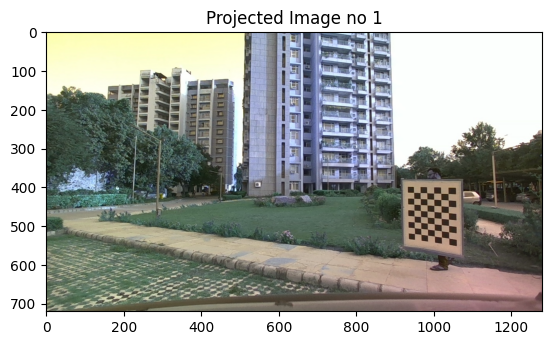

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

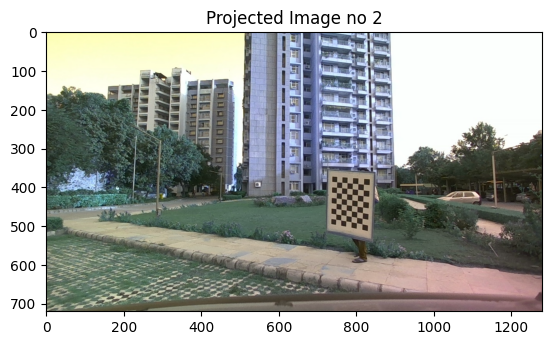

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

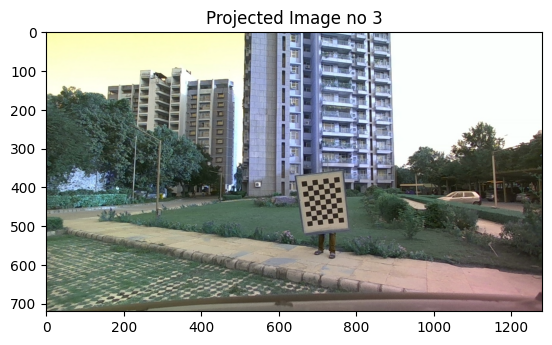

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

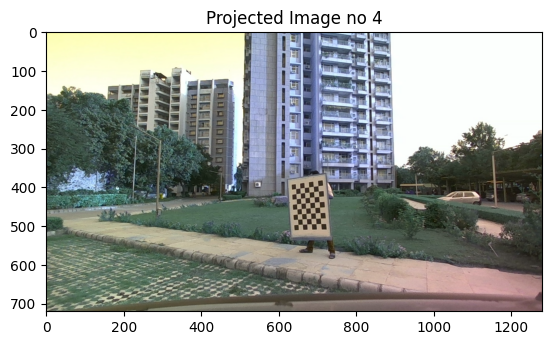

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

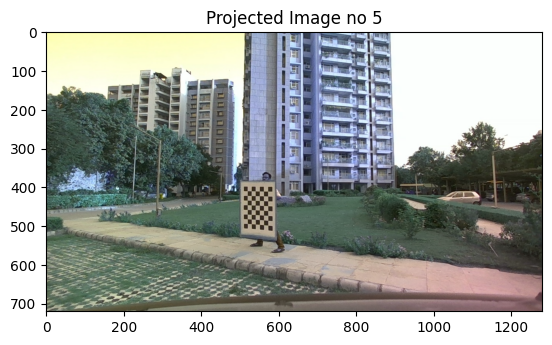

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

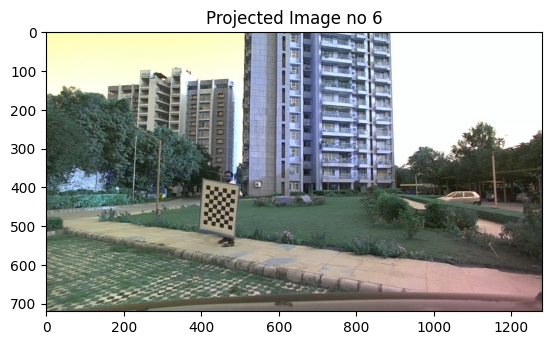

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

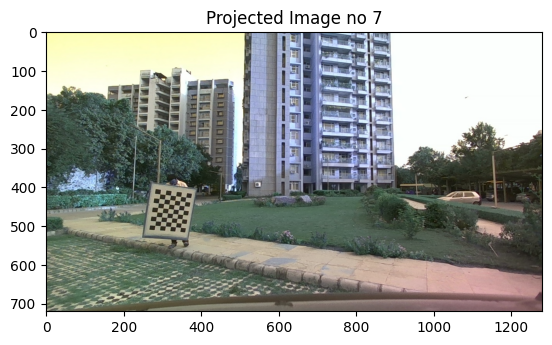

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

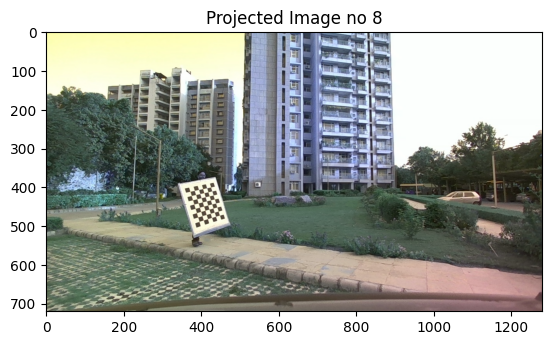

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

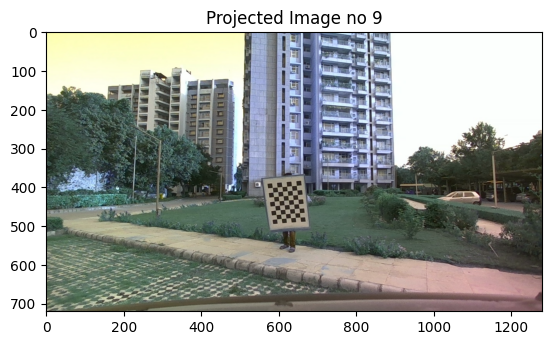

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

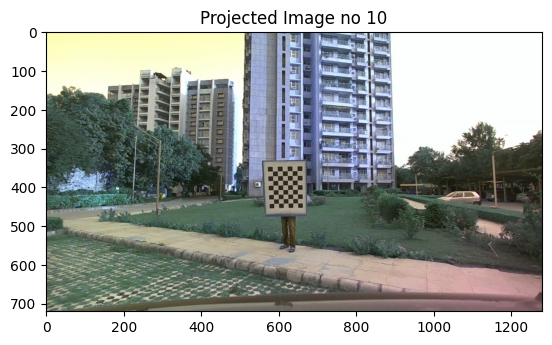

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

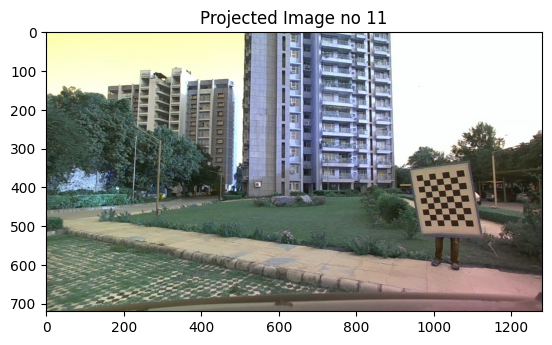

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

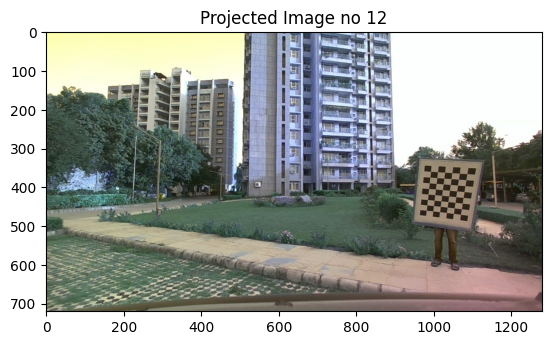

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

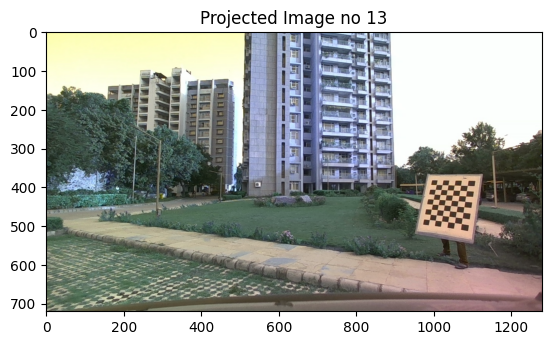

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

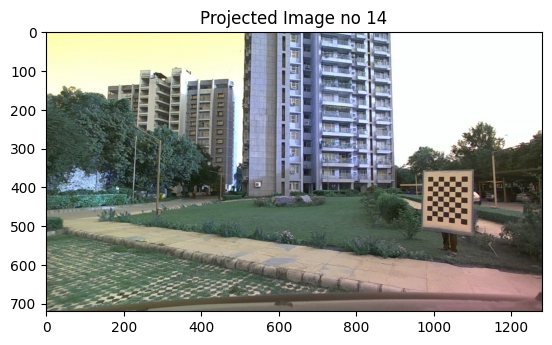

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

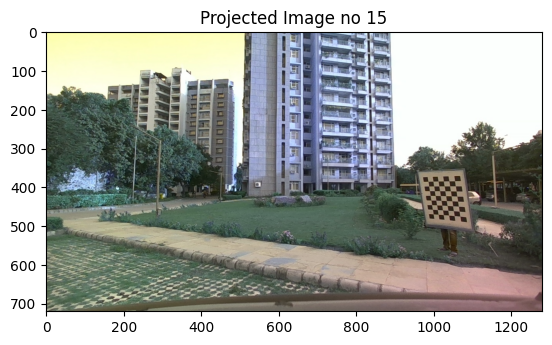

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

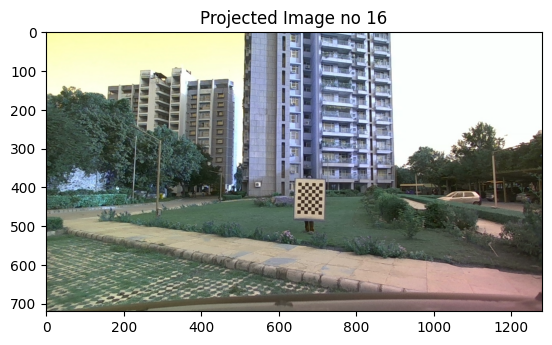

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

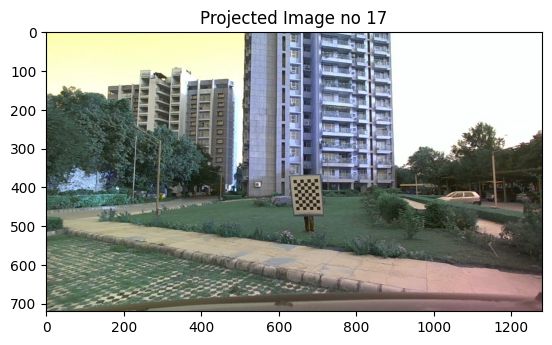

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

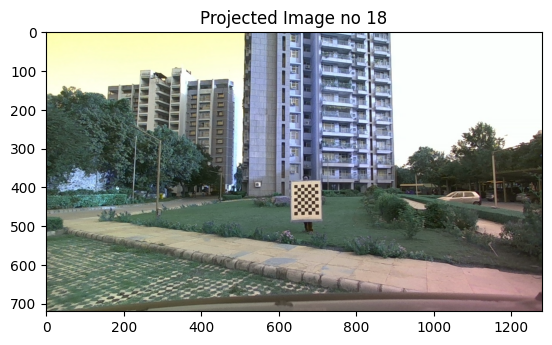

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

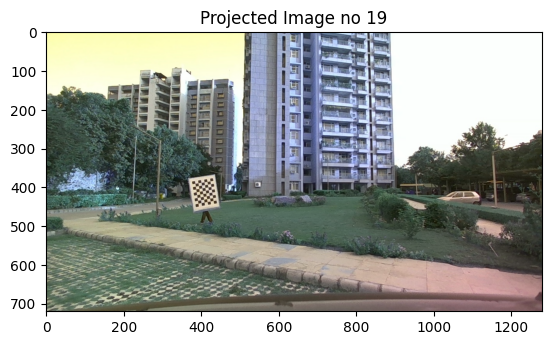

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

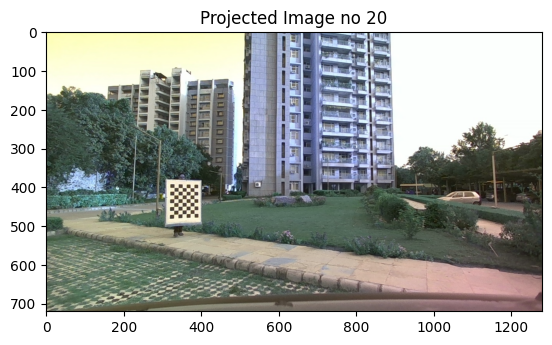

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

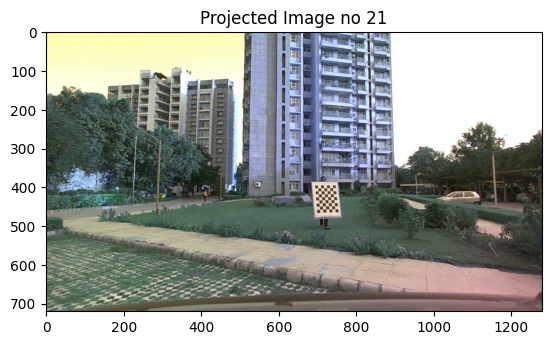

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

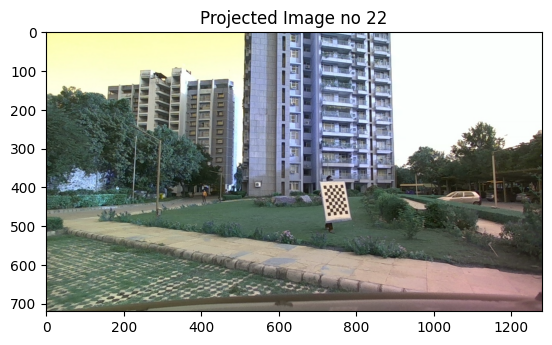

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

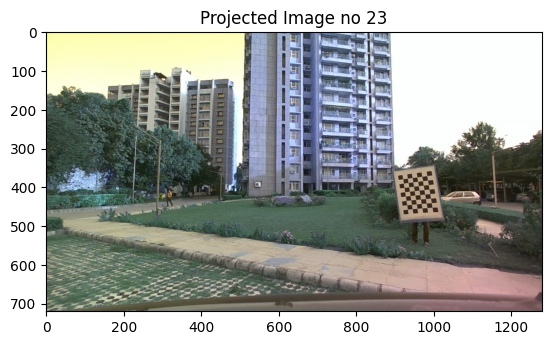

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

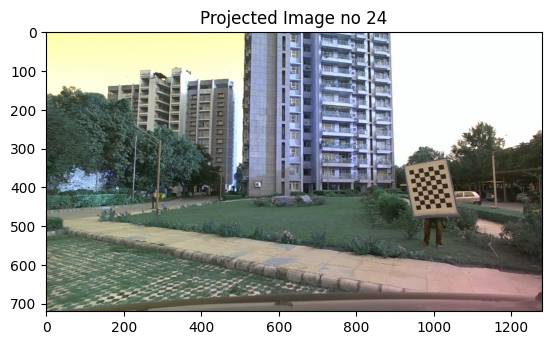

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

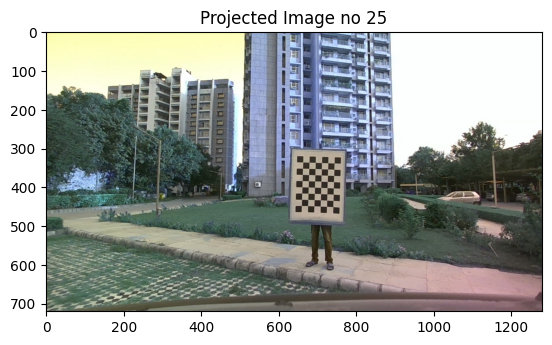

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

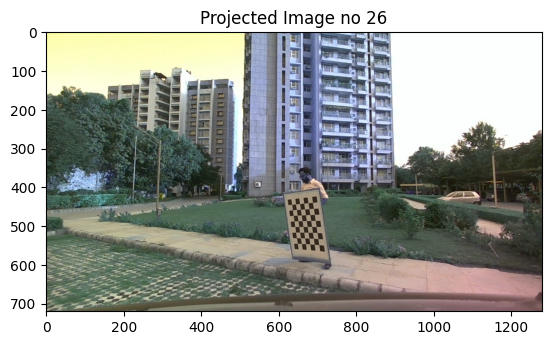

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

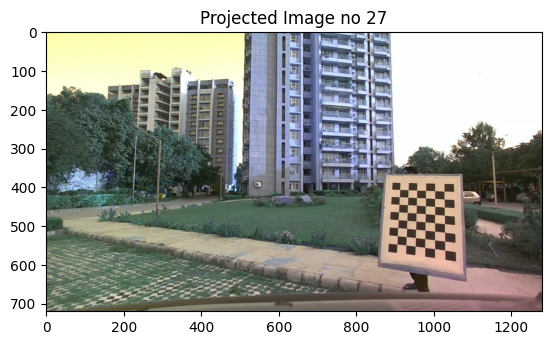

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

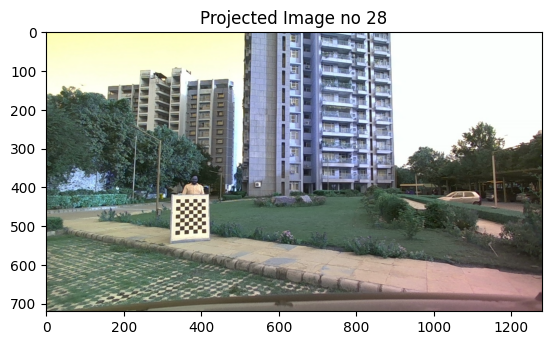

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

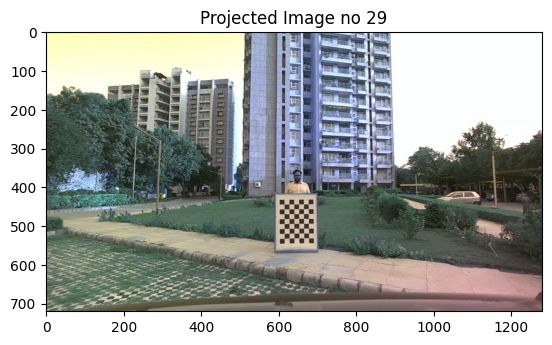

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

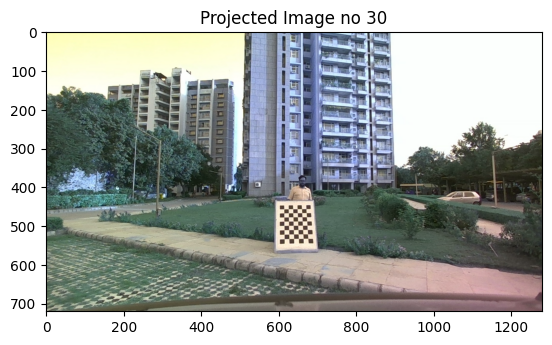

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

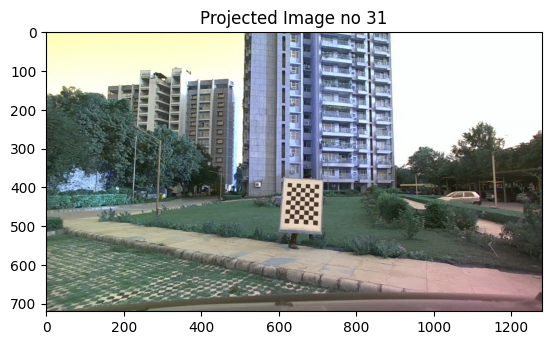

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

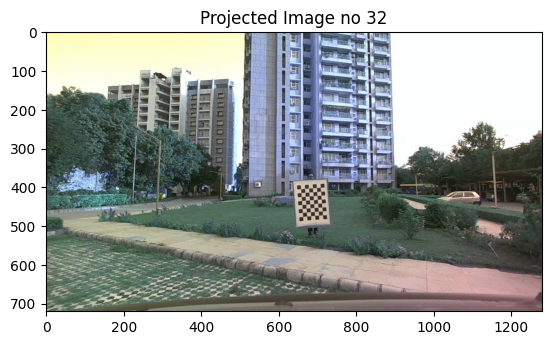

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

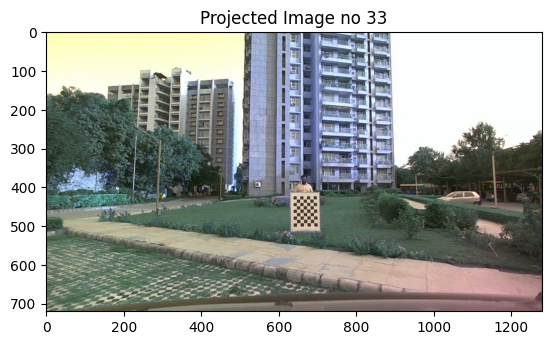

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

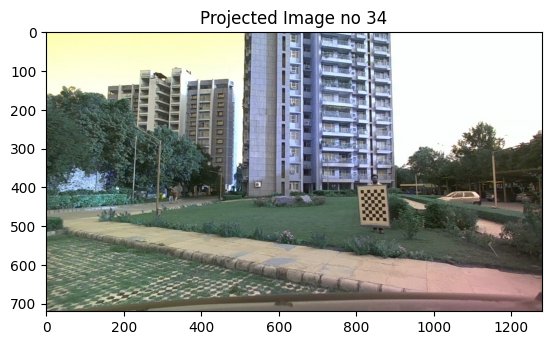

A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside the chessboard boundary.
A point is detected, outside

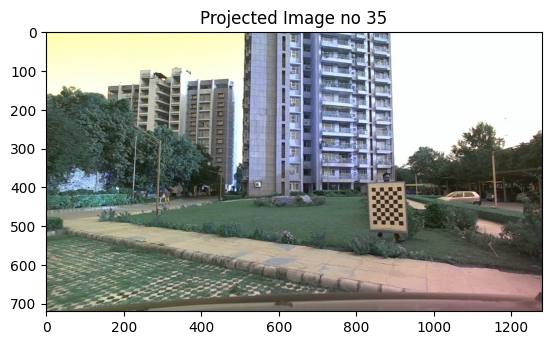

In [60]:
source_folder_cam_images = "datasets\camera_images"
extension_cam_images = "*.jpeg" 

source_folder_lidar_scans = "datasets\lidar_scans"
extension_lidar_scans = "*.pcd" 

files_cam_images = sorted(glob.glob(os.path.join(source_folder_cam_images, extension_cam_images)))
files_lidar_scans = sorted(glob.glob(os.path.join(source_folder_lidar_scans, extension_lidar_scans)))

for i in range (len(files_cam_images)):
    # Load image
    cam_image = cv2.imread(files_cam_images[i])

    # Load LIDAR point cloud and transform to camera frame of reference
    pcd_cloud = o3d.io.read_point_cloud(files_lidar_scans[i])
    
    # Transforming the lidar points using the transformation matrix
    pcd_cloud.transform(transformation_matrix)

    # Converting pcd cloud points to numpy array
    pcd_pts = np.array(pcd_cloud.points)
    
    # Getting the projection points
    project_points, _ = cv2.projectPoints(pcd_pts, rotation_vectors[i], translation_vectors[i], camera_intrinsic_matrix, distortion_coefficients)

    
    # Drawing the projected points acquired onto the image
    marginal_error = 4
    for pts in range(len(project_points)):
        iter = 1
        for _, corner_pt in enumerate(corners[i]):
            coordinates_tup = tuple(map(int, project_points[pts][0]))
            x = corner_pt[0]
            y = corner_pt[1]
            
            a = x - marginal_error
            b = project_points[pts][0][0]
            c = x + marginal_error
            d = y - marginal_error
            e = project_points[pts][0][1]
            f = y + marginal_error
            
            if a <= b and b <= c and d <= e and e <= f:
                cv2.circle(cam_image, coordinates_tup, 6, (0, 0, 255), 40)
            else:
                print("A point is detected, outside the chessboard boundary.")
                
            iter += 1

      
    window_name = "Projected Image no " + str(i+1)
    plt.title(window_name)
    plt.imshow(cam_image)
    plt.show()

## 2.5

### Cosine distances

In [61]:
cosine_dis = []

for i in range (len(camera_normals)):
    cam_to_lid_matrix = transformation_matrix
    cam_to_lid_matrix = cam_to_lid_matrix[:3, :3]
    normal_lidar = np.matmul(cam_to_lid_matrix, lidar_normals[i])
    
    # Computing the cosine distances
    A = np.matmul(camera_normals[i], normal_lidar)
    B = np.linalg.norm(camera_normals[i])
    C = np.linalg.norm(normal_lidar)
    
    cosD = np.abs(A / (B*C))
    cosine_dis.append(cosD)
    
print("The cosine distances between the camera normal and the transformed LIDAR normals are: \n")
for i in cosine_dis:
    print(i)
    

The cosine distances between the camera normal and the transformed LIDAR normals are: 

0.3087146849351827
0.30592934681739525
0.07772236751522031
0.3125278282222832
0.2714410170963939
0.09921920496533207
0.590616925682455
0.44585110710870246
0.06484168701391056
0.14937268859638161
0.3076068622883333
0.26511520197977817
0.1378609517964932
0.23303878313673698
0.2491676840941081
0.10783214622216475
0.13802273117689534
0.23597229206829223
0.21986439225789783
0.4870934393750459
0.015505582500562776
0.2940277646541023
0.30264918262938745
0.29920276078687397
0.00896159482456219
0.30215595865562517
0.33111962191746924
0.1588934203790947
0.046639174719663085
0.16541647330156942
0.14461867185286129
0.062157138774251865
0.05141614573720306
0.31775742667289764
0.3723331300093486


### Histogram

In [62]:
H = np.histogram(cosine_dis, bins = 35)

### Plotting histogram errors

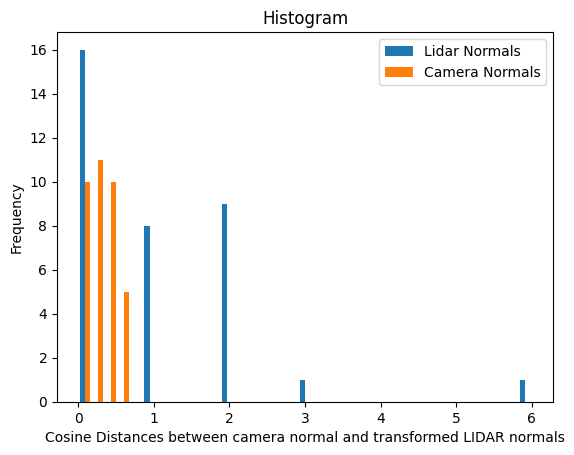

In [63]:
plt.hist(H, bins = 35)
plt.xlabel('Cosine Distances between camera normal and transformed LIDAR normals')
plt.legend(['Lidar Normals', 'Camera Normals'], loc = 'upper right')
plt.ylabel('Frequency')
plt.title('Histogram')
plt.show()

### Average error and Standard Deviation

In [64]:
error = np.mean(cosine_dis)
std_deviation = np.std(cosine_dis)

print("Average error:", error)
print("Standard Deviation", std_deviation)

Average error: 0.22516186827898502
Standard Deviation 0.1350920104151201
